In [1]:
#import packages for analysis
import scanpy as sc
import pandas as pd
import numpy as np
import os
from matplotlib import rcParams
import seaborn as sb
import matplotlib.pyplot as plt
import anndata as ad
from scipy import sparse
from anndata import AnnData
import time
import MACA as maca          

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.13.5 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.6


In [3]:
# the file that will store the analysis tts
#results_file = '/home/mmokhtari/INF_analysis/INF_analysis_filtered.h5ad' 

In [4]:
#reading the donor_ids
donor = pd.read_csv('/home/mmokhtari/INF_analysis/donor_ids.tsv',sep="\t")
#setting the cell_barcode as the denor_ids index
donor.set_index('cell',inplace=True)

In [5]:
#reading the raw_feature_bc_matrix
adata = sc.read_10x_h5('/home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5')

reading /home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5
 (0:00:02)


In [10]:
cells_to_keep = pd.read_csv("/home/mmokhtari/INF_analysis/cells.csv")
cells_to_keep = cells_to_keep["0"]

In [11]:
cells_to_keep.shape

(9460,)

In [12]:
#assigning the donor_ids to adata.obs
adata.obs["donor"] = donor["donor_id"]

In [13]:
adata = adata[cells_to_keep]

In [14]:
adata.var_names_make_unique() 

normalizing counts per cell
    finished (0:00:00)


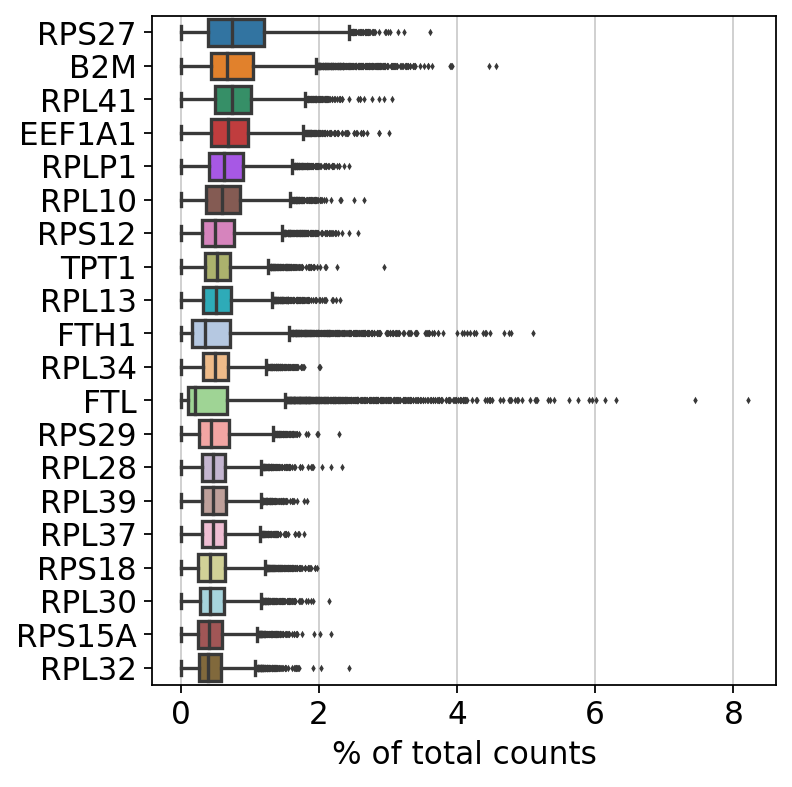

In [15]:
sc.pl.highest_expr_genes(adata, n_top=20, )


In [16]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

In [17]:
sc.pp.normalize_total(adata, target_sum=1e4)


normalizing counts per cell
    finished (0:00:00)


In [19]:
sc.pp.log1p(adata)


In [20]:
adata.raw = adata


In [21]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


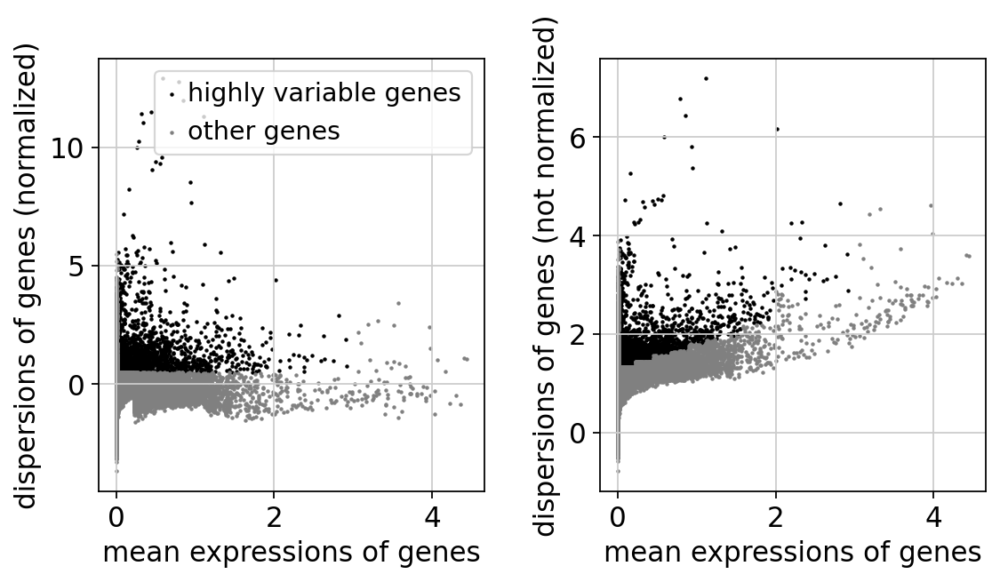

In [22]:
sc.pl.highly_variable_genes(adata)


In [23]:
adata = adata[:, adata.var.highly_variable]


In [24]:
sc.pp.scale(adata, max_value=10)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [25]:
sc.tl.pca(adata, svd_solver='arpack')


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)


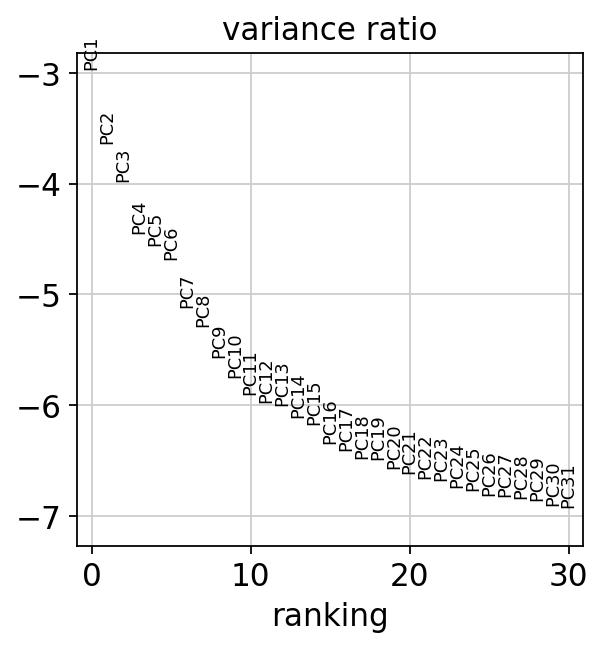

In [26]:
sc.pl.pca_variance_ratio(adata, log=True)


In [27]:
#adata.write(results_file)


In [28]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:06:31)


In [29]:
sc.tl.umap(adata)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


In [30]:
sc.tl.leiden(adata)


running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


<Figure size 800x800 with 0 Axes>

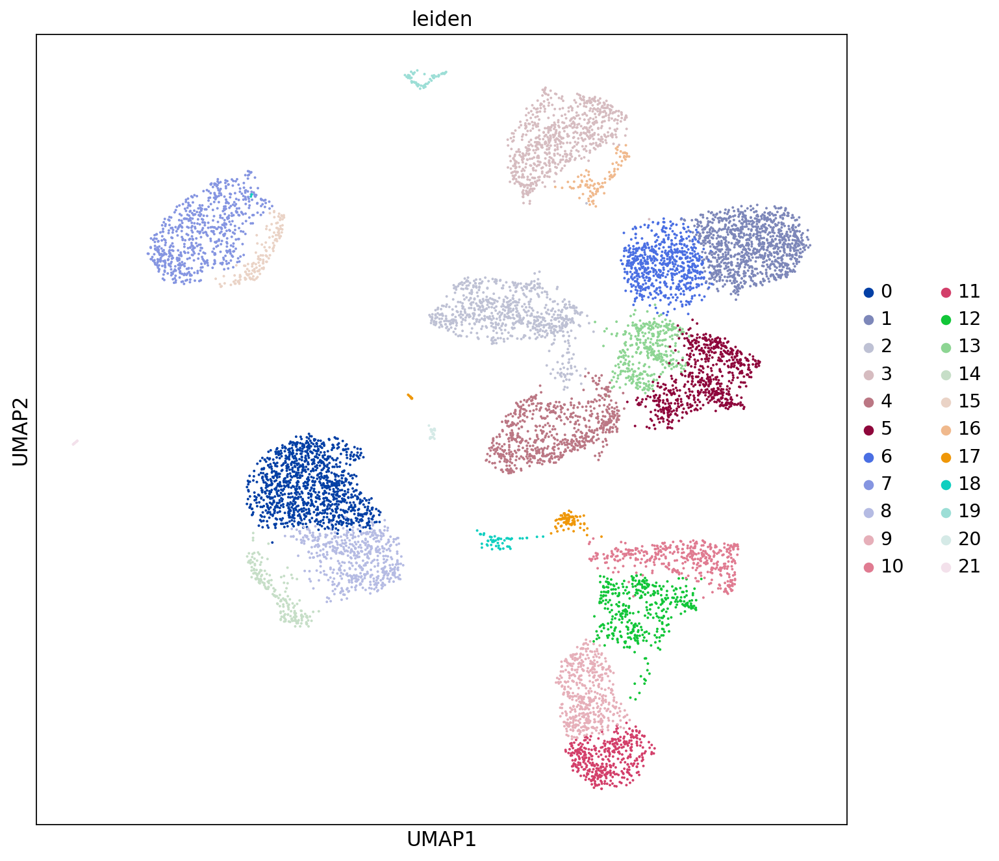

In [31]:
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color='leiden')


<Figure size 800x800 with 0 Axes>

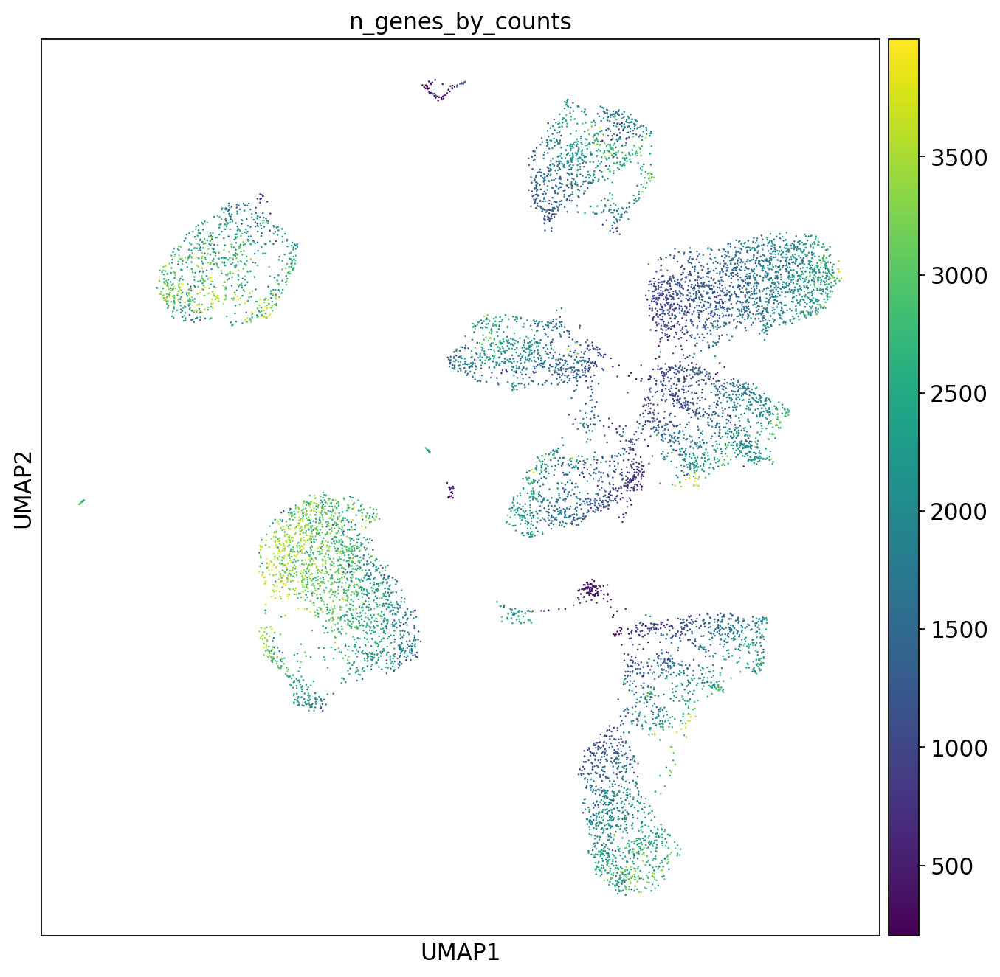

In [32]:

#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["n_genes_by_counts"], legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10, title="n_genes_by_counts")

In [33]:
#sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', key_added = "wilcoxon",pts=True)
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")
#print(sc.get.rank_genes_groups_df(adata, group="0"))
#print(sc.get.rank_genes_groups_df(adata, group="1"))

In [34]:
##load all packages
#import anndata
#import collections
#import numpy as np
#import pandas as pd
#import scanpy as sc
#import MACA as maca

#import warnings
#warnings.filterwarnings("ignore")

In [35]:
#Try MACA with the the MACA markers
pg_df = pd.read_table('/home/mmokhtari/INF_analysis/PanglaoDB_markers_27_Mar_2020 (2).tsv.gz')

In [36]:
##remove mouse specific genes
pg_df = pg_df[pg_df['species']!='Mm']
cell_markers = {}##cell_marker is dictionary that contains names of cell types and their marker genes
marker_list = []
for i in list(set(pg_df["cell type"].values.tolist())):
    genes = pg_df[pg_df["cell type"]==i]['official gene symbol'].values.tolist()
    ##only use cell type with at least 5 genes and less than 300 genes
    if len(genes)>=5 and len(genes)<=300:
        cell_markers[i]=genes
        marker_list+= genes
marker_list = list(set(marker_list))
marker_list = [i for i in marker_list if i in adata.var.index]
len(marker_list)

841

In [37]:
ad = adata.copy()
ad = ad[:,marker_list]

##run MACA
ad, annotation = maca.singleMACA(ad=ad, cell_markers=cell_markers,
                                 res=[1,1.5,2],n_neis=[3,5,10])
##we define louvain clustering resolution 1, 1.5 and 2; 
##number of neighbors to define the kNN is 3,5 and 10 separately.
##MACA will get 9 clustering results, using this set of parameteres.
##The final annotation is ensembled via voting.

(9460, 100)
(9460, 100)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clusterin

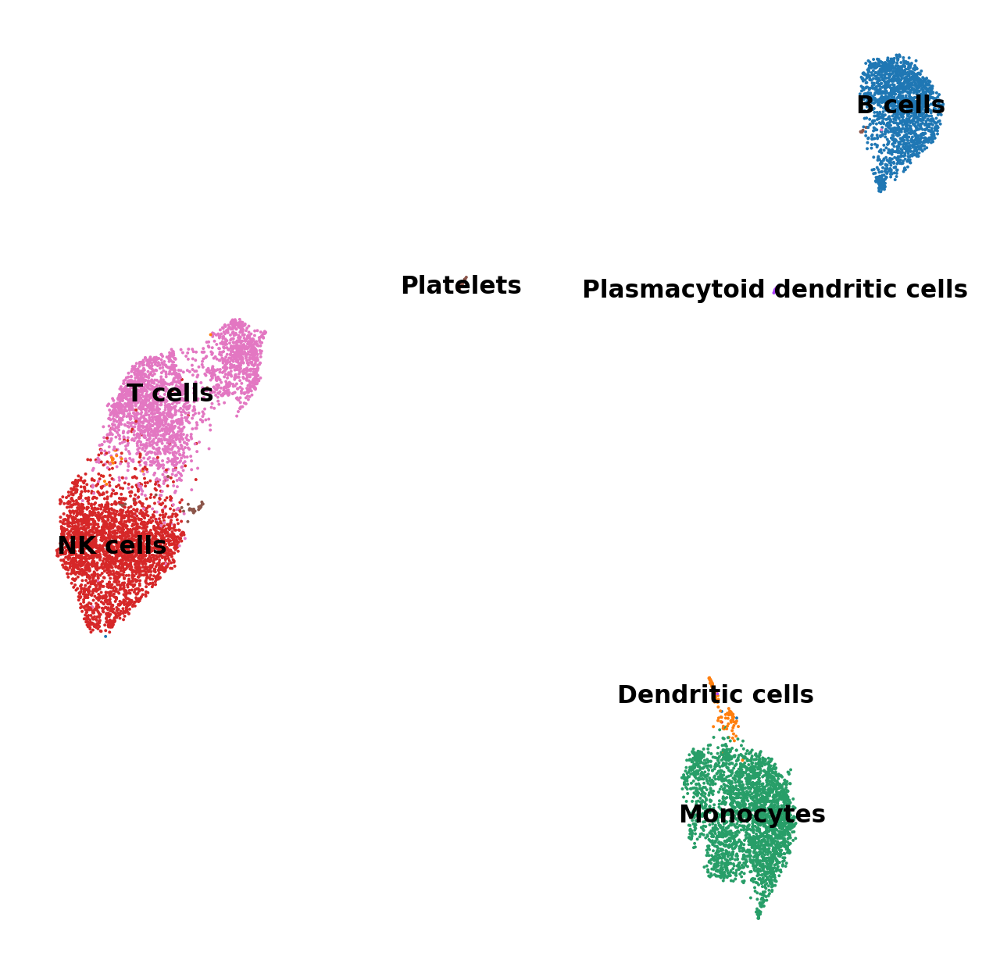

In [38]:
##visualization
ad.obs['Annotation']=np.array(annotation)
sc.pl.umap(ad, color='Annotation', legend_loc='on data', title='', frameon=False)

In [39]:
#Try maca with azimuth df
azimuth_markers = pd.read_excel('/home/mmokhtari/INF_analysis/Azimuth_Markers.xlsx')
cols = azimuth_markers['Markers'].str.split(',', expand = True)
azimuth_markers.drop(['Markers', 'Label', 'OBO Ontology ID'], inplace=True, axis=1)
azimuth_markers = pd.concat([azimuth_markers, cols], axis = 1)
azimuth_markers

,Expanded Label,0,1,2,3,4,5,6,7,8,9
0,Intermediate B cell,MS4A1,TNFRSF13B,IGHM,IGHD,AIM2,CD79A,LINC01857,RALGPS2,BANK1,CD79B
1,Memory B cell,MS4A1,COCH,AIM2,BANK1,SSPN,CD79A,TEX9,RALGPS2,TNFRSF13C,LINC01781
2,Naive B cell,IGHM,IGHD,CD79A,IL4R,MS4A1,CXCR4,BTG1,TCL1A,CD79B,YBX3
3,Plasmablast,IGHA2,MZB1,TNFRSF17,DERL3,TXNDC5,TNFRSF13B,POU2AF1,CPNE5,HRASLS2,NT5DC2
4,CD4+ Cytotoxic T,GZMH,CD4,FGFBP2,ITGB1,GZMA,CST7,GNLY,B2M,IL32,NKG7
5,CD4+ Naive T,TCF7,CD4,CCR7,IL7R,FHIT,LEF1,MAL,NOSIP,LDHB,PIK3IP1
6,CD4+ Proliferating T,MKI67,TOP2A,PCLAF,CENPF,TYMS,NUSAP1,ASPM,PTTG1,TPX2,RRM2
7,CD4+ Central Memory T,IL7R,TMSB10,CD4,ITGB1,LTB,TRAC,AQP3,LDHB,IL32,MAL
8,CD4+ Effector Memory T,IL7R,CCL5,FYB1,GZMK,IL32,GZMA,KLRB1,TRAC,LTB,AQP3
9,Regulatory T,RTKN2,FOXP3,AC133644.2,CD4,IL2RA,TIGIT,CTLA4,FCRL3,LAIR2,IKZF2


In [40]:
#Create lists required for creating MACA dictionary for annotation
cells_of_interest_az = azimuth_markers['Expanded Label'].values.tolist()

In [41]:
azimuth_markers.loc[:,0:9] = azimuth_markers.loc[:,0:9].astype(str)

In [42]:
#strip spaces in columns 1:9 because from the second element in the values in dictionary created, there were spaces
for i in range(0,10):
    azimuth_markers[i] = azimuth_markers[i].str.strip()


In [43]:
#check is spaces have been stripped
azimuth_markers[azimuth_markers[0].str.count(' ') == 1]

,Expanded Label,0,1,2,3,4,5,6,7,8,9


In [44]:
cell_markers_az = {}
marker_list_az = []
for i,j in zip(range(0,93),cells_of_interest_az):
    x = azimuth_markers.iloc[i,:].values.tolist()
    cell_markers_az[j] = x[:]
    marker_list_az += x[1:]

In [45]:
#Select unique markers
marker_list_az = list(set(marker_list_az))
len(marker_list_az)

215

In [46]:
#Make copy of adata with genes present in the marker_list list to run MACA
ad_az = adata.copy()
#ad_az = ad_az[:,marker_list_az].copy()


In [47]:
#Run MACA for cluster annotation
start_time = time.time()
ad_az, annotation_az = maca.singleMACA(ad=ad_az, cell_markers=cell_markers_az,res=[1, 1.5, 2],n_neis=[3,5,10])
#print("--- %s mins ---" % int((time.time() - start_time)/60))

(9460, 23)
(9460, 23)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 72 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering


In [48]:
#Add annotation column to the copied adata
ad_az.obs['Annotation']=np.array(annotation_az)

In [49]:
#Add annotation column from the copied adata to the original adata
adata.obs['Ann_az_default'] = ad_az.obs.Annotation

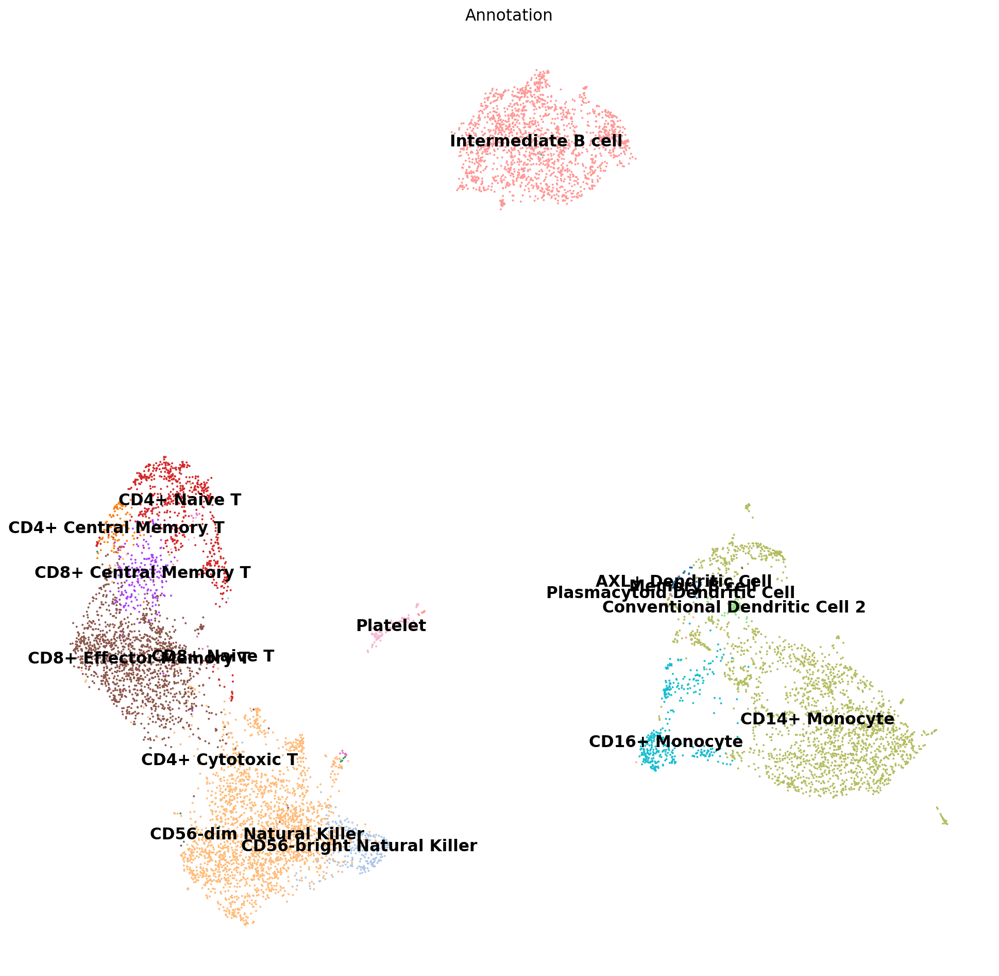

In [50]:
#Visualization of the cluster annotation by MACA
rcParams['figure.figsize']=(15,15)

sc.pl.umap(ad_az, color='Annotation' , legend_loc='on data', frameon=False)

In [51]:
adata.obs["annotation_AZ"] = ad_az.obs["Annotation"]

<Figure size 800x800 with 0 Axes>

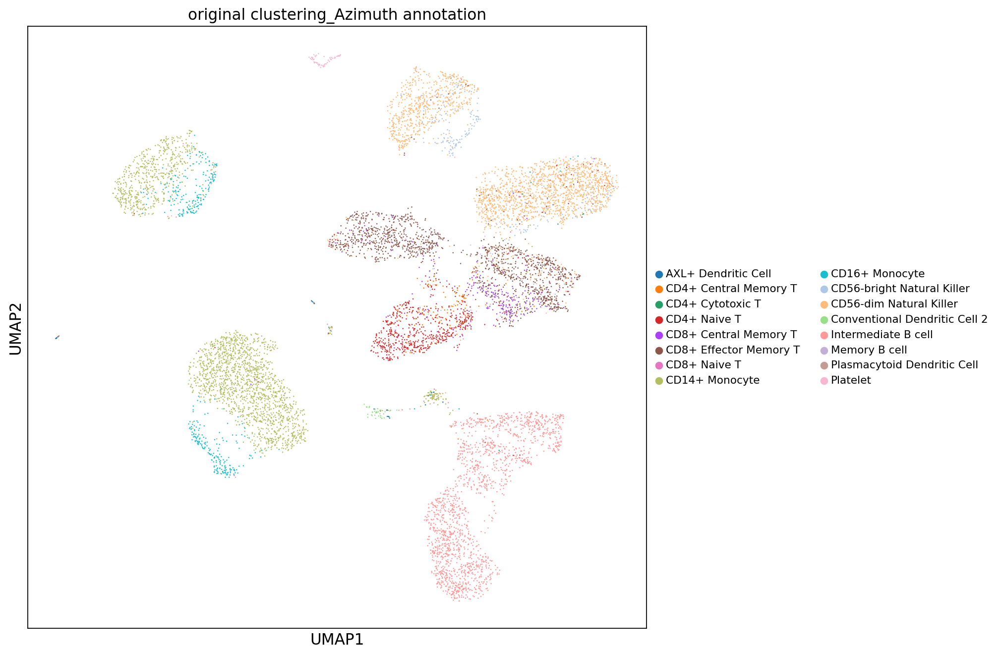

In [52]:
#Visualize the clusters with umap
#original clustering_Azimuth annotation
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["annotation_AZ"],edgecolor='none', size=5,legend_fontsize = "x-small", show=True, linewidths=10, title="original clustering_Azimuth annotation")

<Figure size 800x800 with 0 Axes>

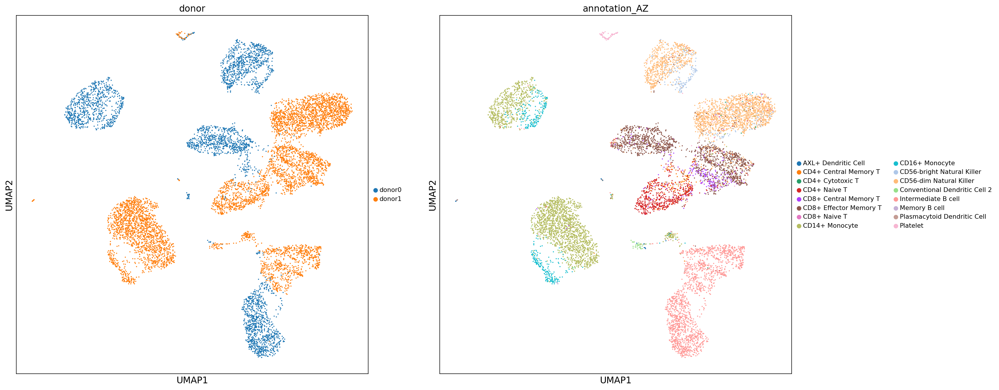

In [53]:
#donor
adata.obs["annotation_MACA"] = ad.obs["Annotation"]
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["donor","annotation_AZ"],edgecolor='none', size=12, show=True, linewidths=10,legend_fontsize = "x-small", title="donor")

<Figure size 800x800 with 0 Axes>

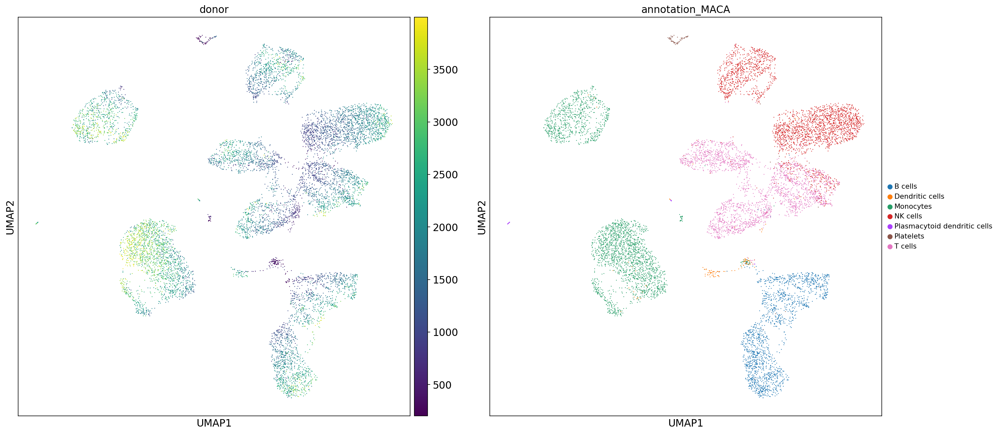

In [54]:
#donor
adata.obs["annotation_MACA"] = ad.obs["Annotation"]
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["n_genes_by_counts","annotation_MACA"],edgecolor='none' ,size=5, show=True, linewidths=10,legend_fontsize = "x-small", title="donor")

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:33)


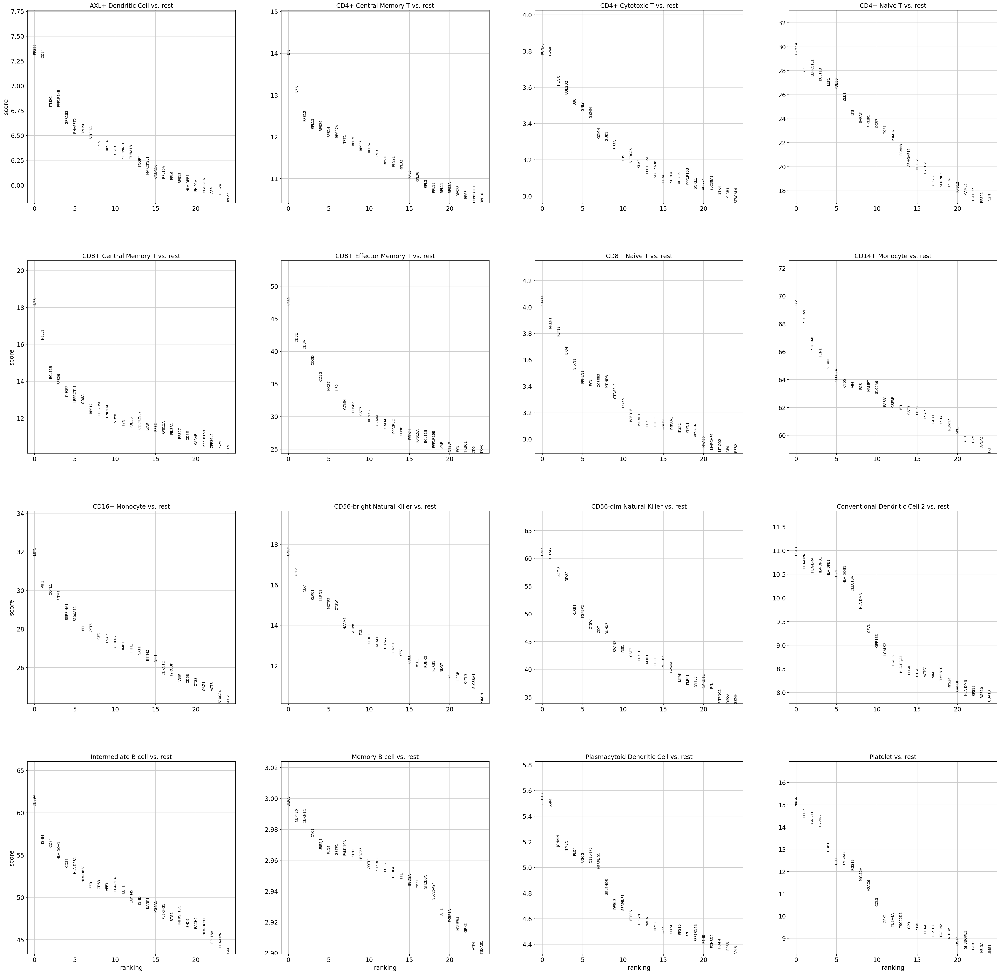

In [55]:
#adata = adata[adata.obs["annotation_AZ"] != "CD8+ Naive T"]
sc.tl.rank_genes_groups(adata,'annotation_AZ', method='wilcoxon', key_added = "wilcoxon",pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")
#print(sc.get.rank_genes_groups_df(adata, group="CD56-dim Natural Killer"))
#print(sc.get.rank_genes_groups_df(adata, group="CD14+ Monocyte"))

In [56]:
#print(sc.get.rank_genes_groups_df(adata, group="CD56-dim Natural Killer"))
ranks=sc.get.rank_genes_groups_df(adata, group=None,key='wilcoxon')


In [57]:
new = ranks[ranks.pvals_adj < 0.05]

In [58]:
new.sort_values(by=["pvals_adj","pct_nz_group"])

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
165106,CD14+ Monocyte,ETS1,-44.057899,-5.717808,0.000000,0.000000,0.033407,0.632289
268299,Intermediate B cell,TYROBP,-38.986374,-6.249666,0.000000,0.000000,0.034259,0.622248
165103,CD14+ Monocyte,CD247,-42.966194,-6.260188,0.000000,0.000000,0.036484,0.618093
268301,Intermediate B cell,PRKCH,-39.502956,-5.763702,0.000000,0.000000,0.040165,0.637698
165099,CD14+ Monocyte,KLF12,-41.597057,-5.283049,0.000000,0.000000,0.046593,0.607933
...,...,...,...,...,...,...,...,...
309754,Platelet,HLA-C,2.806653,0.100198,0.005006,0.049914,0.837398,0.949877
265099,Intermediate B cell,SCCPDH,-2.503649,-1.144209,0.012292,0.049940,0.033077,0.071842
184986,CD16+ Monocyte,PBXIP1,-2.659921,-1.458606,0.007816,0.049942,0.079602,0.151468
63053,CD4+ Naive T,TRAPPC12,2.597241,1.105443,0.009398,0.049950,0.143333,0.084312


In [59]:
marker_AZ = {
    'CD14+ Monocyte': ["S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A1", "IL1B", "CD14", "G0S2", "FCN1"],
    'CD16+ Monocyte': ["S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A1", "IL1B", "CD14", "G0S2", "FCN1"],
    'CD4+ Effector Memory T': ["IL7R", "CCL5", "FYB1", "GZMK", "IL32", "GZMA", "KLRB1", "TRAC", "LTB", "AQP3"],
    'CD4+ Naive T': ["TCF7", "CD4", "CCR7", "IL7R", "FHIT", "LEF1", "MAL", "NOSIP", "LDHB", "PIK3IP1"],
    'CD56-bright Natural Killer': ["XCL2", "FCER1G", "SPINK2", "TRDC", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A"],
    'CD56-dim Natural Killer': ["GNLY", "TYROBP", "NKG7", "FCER1G", "GZMB", "TRDC", "PRF1", "FGFBP2", "SPON2", "KLRF1"],
    'CD8+ Central Memory T': ["CD8B", "ANXA1", "CD8A", "KRT1", "YBX3", "IL7R", "TRAC", "NELL2", "LDHB"],
    'CD8+ Effector Memory T': ["CCL5", "GZMH", "CD8A", "TRAC", "KLRD1", "NKG7", "GZMK", "CST7", "CD8B", "TRGC2"],
    'CD8+ Naive T': ["CD8B", "S100B", "CCR7", "RGS10", "NOSIP","LEF1", "CRTAM", "CD8A", "OXNAD1"],
    'Conventional Dendritic Cell 2': ["FCER1A", "HLA-DQA1", "CLEC10A", "CD1C", "ENHO", "PLD4", "GSN", "SLC38A1", "NDRG2", "AFF3"],
    'Intermediate B cell': ["MS4A1", "TNFRSF13B", "IGHM", "IGHD", "AIM2", "CD79A", "RALGPS2", "BANK1", "CD79B"],
    'Memory B cell': ["MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C"],
    'Mucosal associated invariant T': ["KLRB1", "NKG7", "GZMK", "IL7R", "SLC4A10", "GZMA", "CXCR6", "PRSS35", "RBM24", "NCR3"],
    'Platelet': ["PPBP", "PF4", "NRGN", "GNG11", "CAVIN2", "TUBB1", "CLU", "RGS18", "GP9"],
    'Regulatory T': ["RTKN2", "FOXP3", "CD4", "IL2RA", "TIGIT", "CTLA4", "FCRL3", "LAIR2", "IKZF2"],
    'gamma-delta T': ["TRDC", "TRGC1", "TRGC2", "KLRC1", "NKG7", "TRDV2", "CD7","TRGV9", "KLRD1", "KLRG1"],
}
#IL7R
all_marker_AZ = ["S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A1", "IL1B", "CD14", "G0S2", "FCN1","S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A1", "IL1B", "CD14", "G0S2", "FCN1",
                "S100A9", "CTSS", "S100A8", "LYZ", "VCAN", "S100A1", "IL1B", "CD14", "G0S2", "FCN1",
                "IL7R", "CCL5", "FYB1", "GZMK", "IL32", "GZMA", "KLRB1", "TRAC", "LTB", "AQP3",
                "TCF7", "CD4", "CCR7", "IL7R", "FHIT", "LEF1", "MAL", "NOSIP", "LDHB", "PIK3IP1",
                "XCL2", "FCER1G", "SPINK2", "TRDC", "KLRC1", "XCL1", "SPTSSB", "PPP1R9A", "NCAM1", "TNFRSF11A",
                "GNLY", "TYROBP", "NKG7", "FCER1G", "GZMB", "TRDC", "PRF1", "FGFBP2", "SPON2", "KLRF1",
                "CD8B", "ANXA1", "CD8A", "KRT1", "YBX3", "IL7R", "TRAC", "NELL2", "LDHB",
                "CCL5", "GZMH", "CD8A", "TRAC", "KLRD1", "NKG7", "GZMK", "CST7", "CD8B", "TRGC2",
                "CD8B", "S100B", "CCR7", "RGS10", "NOSIP","LEF1", "CRTAM", "CD8A", "OXNAD1",
                "FCER1A", "HLA-DQA1", "CLEC10A", "CD1C", "ENHO", "PLD4", "GSN", "SLC38A1", "NDRG2", "AFF3",
                "MS4A1", "TNFRSF13B", "IGHM", "IGHD", "AIM2", "CD79A", "RALGPS2", "BANK1", "CD79B",
                "MS4A1", "COCH", "AIM2", "BANK1", "SSPN", "CD79A", "TEX9", "RALGPS2", "TNFRSF13C",
                "KLRB1", "NKG7", "GZMK", "IL7R", "SLC4A10", "GZMA", "CXCR6", "PRSS35", "RBM24", "NCR3",
                "PPBP", "PF4", "NRGN", "GNG11", "CAVIN2", "TUBB1", "CLU", "RGS18", "GP9",
                "RTKN2", "FOXP3", "CD4", "IL2RA", "TIGIT", "CTLA4", "FCRL3", "LAIR2", "IKZF2",
                "TRDC", "TRGC1", "TRGC2", "KLRC1", "NKG7", "TRDV2", "CD7","TRGV9", "KLRD1", "KLRG1"]
all_marker_AZ = np.unique(all_marker_AZ)

In [60]:
marker_genes_dict = {
    'CD14+ Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+ Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'CD4+ Effector Memory T': ['IL7R', 'LTB' ,'RPS12'],#
    'CD4+ Naive T': ['CAMK4','IL7R','BCL11B'],#
    'CD56-bright Natural Killer': ['GNLY', 'MCTP2','XCL2'],#
    'CD56-dim Natural Killer': ['GNLY', 'CD247','GZMB'],#
    'CD8+ Central Memory T': ['IL7R','NELL2','RPS29','CD4','CD8A'],#
    'CD8+ Effector Memory T': ['CCL5','CD3E','CD8A'],#
    'CD8+ Naive T': ['RFX7','AKAP9','PRPF39'],#
    'Conventional Dendritic Cell 2': ['CST3','HLA-DRA','HLA-DPA1'],#
    'Intermediate B cell': ['IGHM','CD79A','CD74'],#
    'Memory B cell': ['EZR','CD79A','TNFRSF13C'],#
    'Mucosal associated invariant T': ['NCR3','KLRB1','GNLY'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
    'Regulatory T': ['FYN','PPP1R16B','IKZF2','FOXP3'],#
    'gamma-delta T': ['ARAP2','MTREX','KLRG1'],#
}
#IL7R

In [61]:
marker_AZ = {}
for i in np.unique(adata.obs['annotation_AZ']):
    ranks=sc.get.rank_genes_groups_df(adata, group=i,key='wilcoxon')
    ranks=ranks[ranks["names"].isin(all_marker_AZ)]
    ranks = ranks[ranks["pvals_adj"]<0.2]
    print(ranks.iloc[0:3, 0].values)
    marker_AZ[i] = ranks.iloc[0:3, 0].tolist()
marker_AZ

['PLD4' 'LDHB' 'GSN']
['LYZ' 'S100A9' 'S100A8']
['FCER1G' 'TYROBP' 'CTSS']
['LTB' 'IL7R' 'TRAC']
[]
['IL7R' 'LEF1' 'LTB']
['GNLY' 'XCL2' 'CD7']
['GNLY' 'GZMB' 'NKG7']
['IL7R' 'NELL2' 'CD8A']
['CCL5' 'CD8A' 'NKG7']
[]
['CLEC10A' 'HLA-DQA1' 'RGS10']
['CD79A' 'IGHM' 'HLA-DQA1']
[]
['PLD4' 'CD4']
['NRGN' 'PPBP' 'GNG11']


{'AXL+ Dendritic Cell': ['PLD4', 'LDHB', 'GSN'],
 'CD14+ Monocyte': ['LYZ', 'S100A9', 'S100A8'],
 'CD16+ Monocyte': ['FCER1G', 'TYROBP', 'CTSS'],
 'CD4+ Central Memory T': ['LTB', 'IL7R', 'TRAC'],
 'CD4+ Cytotoxic T': [],
 'CD4+ Naive T': ['IL7R', 'LEF1', 'LTB'],
 'CD56-bright Natural Killer': ['GNLY', 'XCL2', 'CD7'],
 'CD56-dim Natural Killer': ['GNLY', 'GZMB', 'NKG7'],
 'CD8+ Central Memory T': ['IL7R', 'NELL2', 'CD8A'],
 'CD8+ Effector Memory T': ['CCL5', 'CD8A', 'NKG7'],
 'CD8+ Naive T': [],
 'Conventional Dendritic Cell 2': ['CLEC10A', 'HLA-DQA1', 'RGS10'],
 'Intermediate B cell': ['CD79A', 'IGHM', 'HLA-DQA1'],
 'Memory B cell': [],
 'Plasmacytoid Dendritic Cell': ['PLD4', 'CD4'],
 'Platelet': ['NRGN', 'PPBP', 'GNG11']}

In [62]:
markers = {}
for i in np.unique(adata.obs['annotation_AZ']):
    ranks=sc.get.rank_genes_groups_df(adata, group=i,key='wilcoxon')
    ranks = ranks[ranks["pvals_adj"]<0.05]
    ranks = ranks[ranks["pct_nz_group"]<0.2]
    print(ranks.iloc[0:5, 0].values)
    print(i)
    markers[i] = ranks.iloc[0:5, 0].tolist()

['ZFP36L1' 'FNDC3B' 'TANK' 'ARL8B' 'MAPK1']
AXL+ Dendritic Cell
['OLR1' 'HOMER3' 'ASGR2' 'FCGR1A' 'CYP1B1']
CD14+ Monocyte
['TMTC1' 'MS4A4A' 'SPRED1' 'MRAS' 'LYPD2']
CD16+ Monocyte
['CD40LG' 'TAF10' 'NDEL1' 'TMEM176A' 'TMEM176B']
CD4+ Central Memory T
[]
CD4+ Cytotoxic T
['TNFRSF25' 'TBC1D4' 'PASK' 'GCNT4' 'RIC3']
CD4+ Naive T
['CD320' 'HAPLN3' 'CCNJL' 'CAPN12' 'HDGFL3']
CD56-bright Natural Killer
['RAB27B' 'PLXNA4' 'NCR3' 'PTGDS' 'NCAM1']
CD56-dim Natural Killer
['SEC14L2' 'KIF21A' 'NR3C2' 'LSR' 'HABP4']
CD8+ Central Memory T
['CADM1' 'KLRG1' 'MYO6' 'CD160' 'TRAT1']
CD8+ Effector Memory T
[]
CD8+ Naive T
['CMC1' 'AKT3' 'CCL4' 'CCDC88C' 'CD7']
Conventional Dendritic Cell 2
['CD19' 'BLNK' 'CCR6' 'CPNE5' 'KLHL14']
Intermediate B cell
[]
Memory B cell
['GNG2' 'RAB8B' 'KLF2']
Plasmacytoid Dendritic Cell
['CLEC1B' 'ENKUR' 'FAXDC2' 'AQP10' 'SH3BGRL2']
Platelet


In [63]:
ranks = ranks[ranks["pct_nz_group"]<0.1]

In [64]:
ranks = pd.DataFrame(ranks)
#ranks.to_csv("ranks.csv")

In [65]:
#adata.layers['scaled'] = sc.pp.scale(adata, copy = True).X
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3, key="wilcoxon", groupby="annotation_AZ", 
 #                                 colorbar_title = "mean z-score",layer= 'scaled',vmin=-2, vmax=2, cmap='RdBu_r')


In [66]:
ranks = ranks[ranks["names"].isin(all_marker_AZ)]
ranks = ranks[ranks["pct_nz_group"]<0.3]
ranks

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
18933,LTB,-2.998655,-1.476861,2.711745e-03,0.030074,0.097561,0.256828
19003,CD4,-3.072315,-4.765743,2.124055e-03,0.024532,0.008130,0.168791
19065,AFF3,-3.144064,-4.418234,1.666188e-03,0.019947,0.024390,0.185499
19105,HLA-DQA1,-3.195276,-2.832740,1.396972e-03,0.017154,0.032520,0.199850
19150,RALGPS2,-3.259814,-2.882329,1.114853e-03,0.014082,0.024390,0.197387
19241,CD79A,-3.357352,-5.474146,7.869286e-04,0.010567,0.008130,0.182928
19263,IGHM,-3.386597,-29.177502,7.076531e-04,0.009647,0.000000,0.177466
19303,CD14,-3.414180,-4.111270,6.397431e-04,0.008970,0.016260,0.194174
19813,G0S2,-4.147327,-3.227575,3.363796e-05,0.000741,0.040650,0.256292
19872,VCAN,-4.263409,-3.843572,2.013317e-05,0.000475,0.024390,0.246974


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_annotation_AZ']`


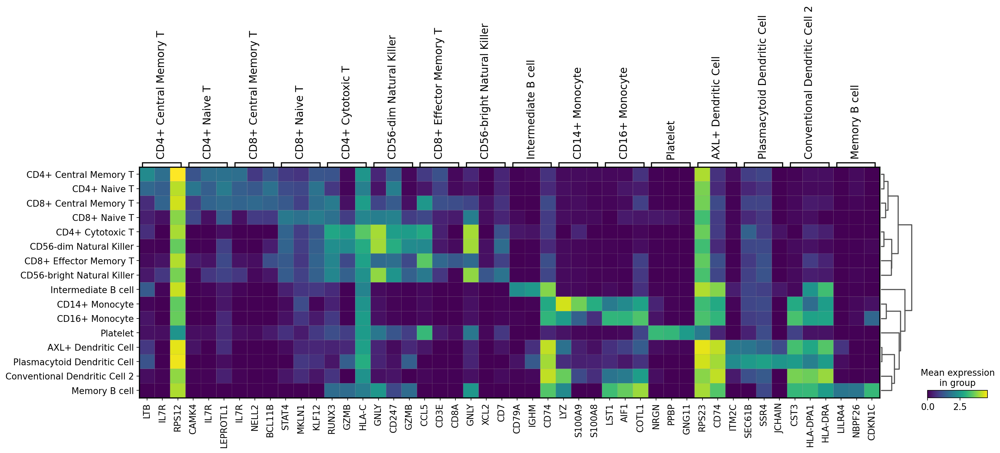

In [67]:
#sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="annotation_AZ", show_gene_labels=True)
#sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="wilcoxon", groupby="annotation_AZ")
#sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="annotation_AZ")
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3, key="wilcoxon", groupby="annotation_AZ")


In [68]:
adata.obs['cell_type_donor'] = adata.obs[['annotation_AZ','donor']].agg('-'.join, axis=1)

In [69]:
cell_type_donor=adata.obs[['annotation_AZ','donor']]

categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD14+ Monocyte, CD16+ Monocyte, CD4+ Effector Memory T, etc.


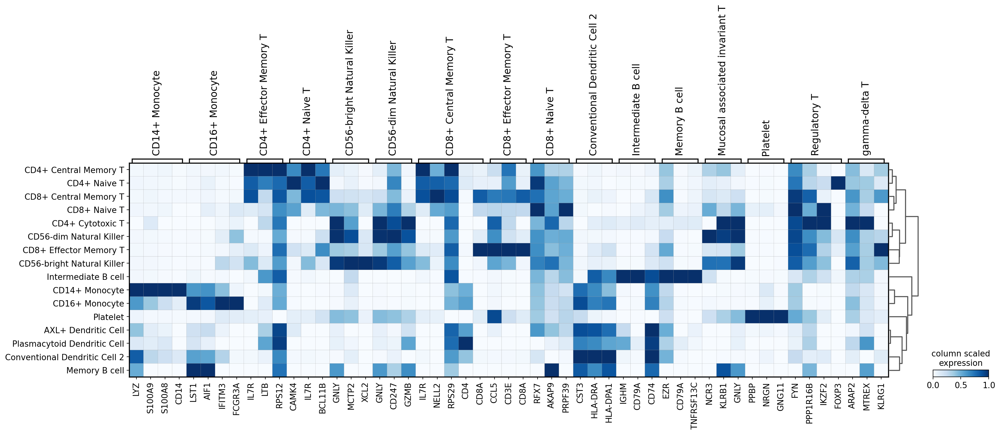

In [70]:
sc.pl.matrixplot(adata, marker_genes_dict ,'annotation_AZ', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


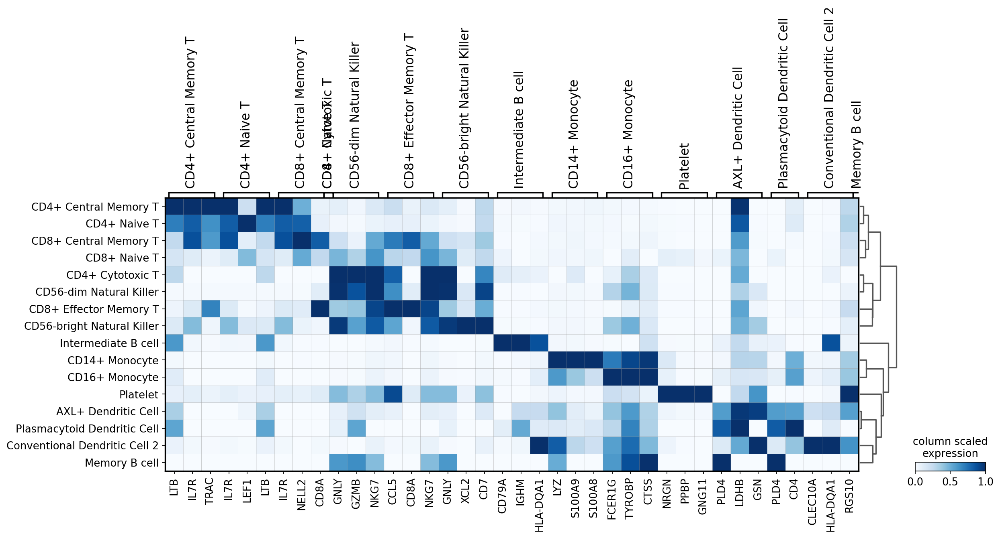

In [71]:
sc.pl.matrixplot(adata, marker_AZ ,'annotation_AZ', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


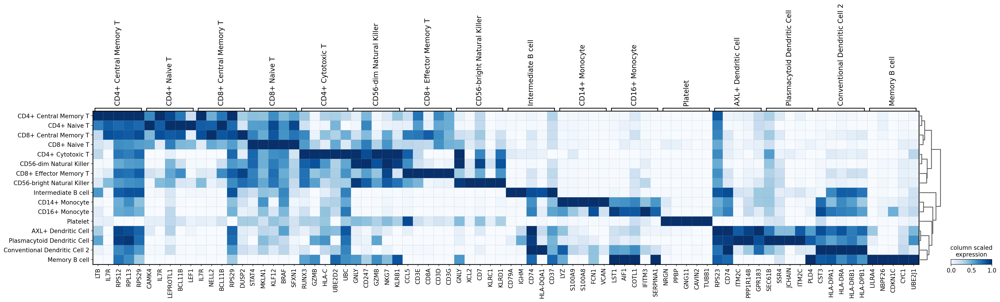

In [72]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="annotation_AZ", dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression')

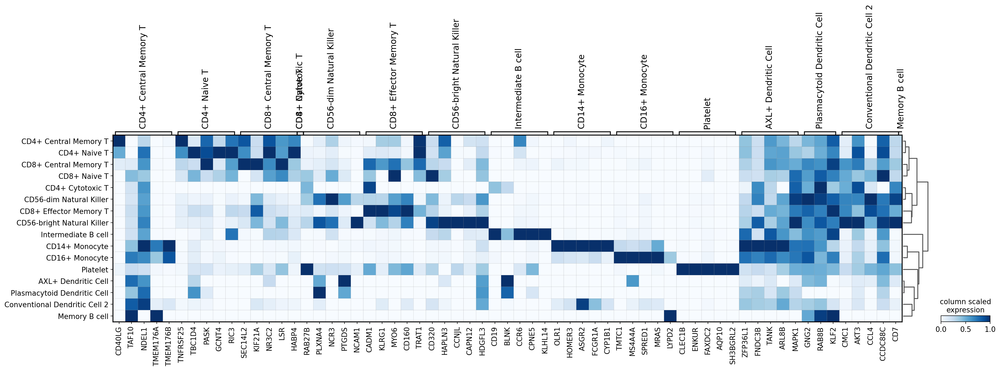

In [73]:
sc.pl.matrixplot(adata, markers ,'annotation_AZ', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD14+ Monocyte, CD16+ Monocyte, CD4+ Effector Memory T, etc.


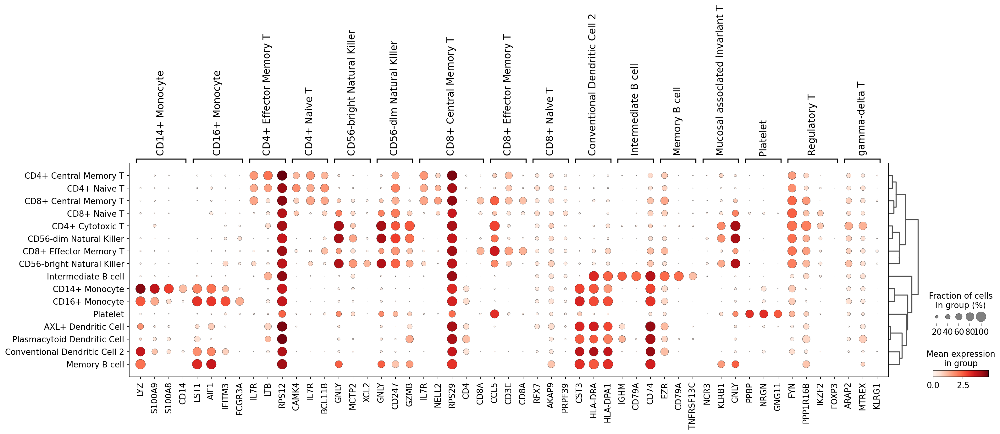

In [74]:
sc.pl.dotplot(adata, marker_genes_dict, 'annotation_AZ', dendrogram=True)


In [75]:
# scale and store results in layer
adata.layers['scaled'] = sc.pp.scale(adata, copy=True).X

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_annotation_MACA']`
categories: B cells, Dendritic cells, Monocytes, etc.
var_group_labels: CD14+ Monocyte, CD16+ Monocyte, CD4+ Effector Memory T, etc.


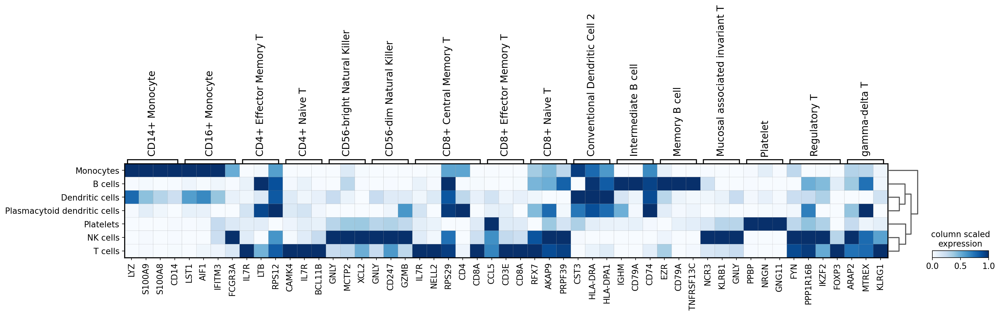

In [76]:
sc.pl.matrixplot(adata, marker_genes_dict, 'annotation_MACA', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


categories: B cells, Dendritic cells, Monocytes, etc.
var_group_labels: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.


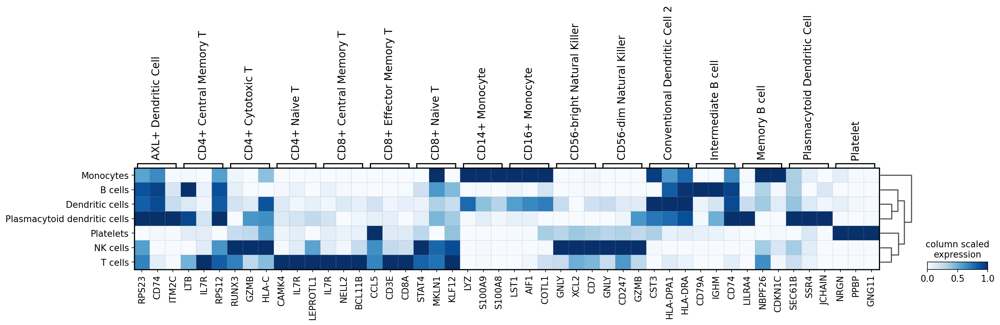

In [77]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3, key="wilcoxon", groupby="annotation_MACA", dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression')

In [78]:
adata.obs["Final_Annotation"] = adata.obs.annotation_AZ

In [79]:
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD4+ Naive T'],"CD4+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD4+ Effector Memory T'],"CD4+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD8+ Central Memory T'],"CD8+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD56-bright Natural Killer'],"NK")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD56-dim Natural Killer'],"NK")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['gamma-delta T'],"NK")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['Mucosal associated invariant T'],"NK")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD8+ Effector Memory T'],"CD8+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD8+ Naive T'],"CD8+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['Regulatory T'],"CD8+_T")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['Memory B cell'],"B")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['Intermediate B cell'],"B")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['Conventional Dendritic Cell 2'],"cDC")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD14+ Monocyte'],"CD14+_Monocyte")
adata.obs["Final_Annotation"]=adata.obs["Final_Annotation"].replace(['CD16+ Monocyte'],"CD16+_Monocyte")

In [80]:
marker_genes_dict_final = {
    'CD4+_T':['CAMK4','IL7R','BCL11B', 'LTB','FOXP3'],
    'CD8+_T':['IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2'],
    'NK':['GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1'],
    'B':['IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C'],
    'cDC':['CST3','HLA-DRA','HLA-DPA1'],
    'CD14+_Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
}
#IL7R

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:31)


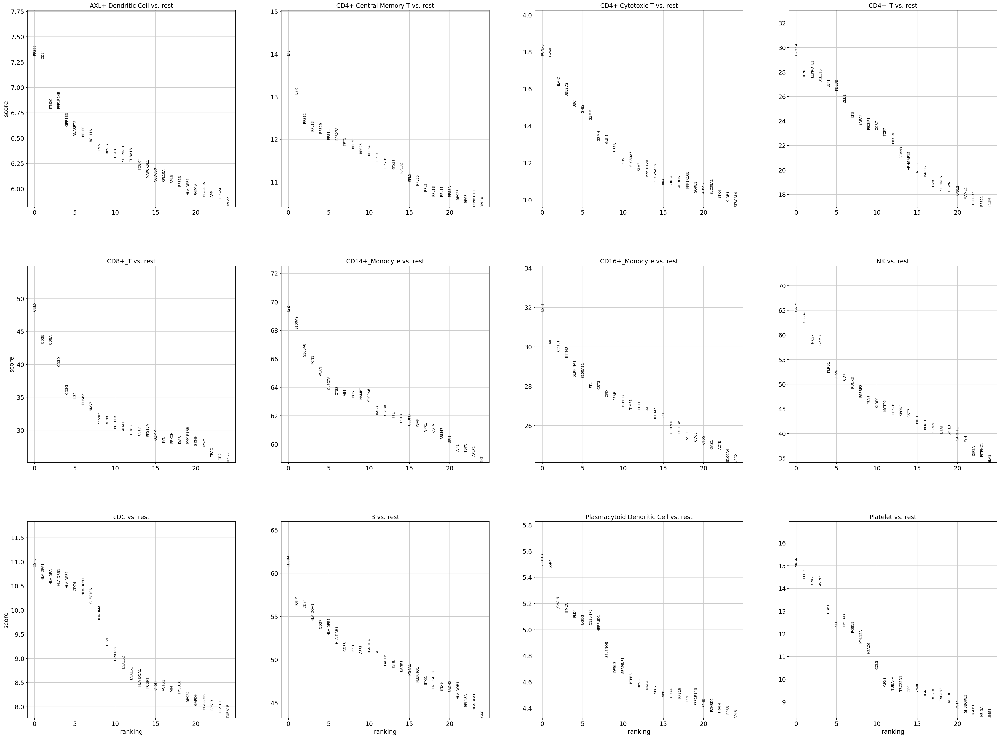

                      group     names     scores  logfoldchanges  \
0       AXL+ Dendritic Cell     RPS23   7.314447        1.499706   
1       AXL+ Dendritic Cell      CD74   7.280134        3.498595   
2       AXL+ Dendritic Cell     ITM2C   6.793200        5.720409   
3       AXL+ Dendritic Cell  PPP1R14B   6.791516        4.296979   
4       AXL+ Dendritic Cell    GPR183   6.617256        3.770760   
...                     ...       ...        ...             ...   
247663             Platelet    TMSB10 -10.369672       -2.452854   
247664             Platelet     RPL23 -10.736095       -2.155629   
247665             Platelet    RPL18A -10.848572       -2.580217   
247666             Platelet      RPS9 -10.996690       -2.360054   
247667             Platelet     RPS11 -11.350602       -2.359211   

               pvals     pvals_adj  pct_nz_group  pct_nz_reference  
0       2.584428e-13  3.441434e-09      1.000000          0.969585  
1       3.334885e-13  3.441434e-09      1.000

In [81]:
#adata = adata[adata.obs["annotation_AZ"] != "CD8+ Naive T"]
sc.tl.rank_genes_groups(adata,'Final_Annotation', method='wilcoxon', key_added = "wilcoxon",pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")
print(sc.get.rank_genes_groups_df(adata,group=None,key="wilcoxon"))
#print(sc.get.rank_genes_groups_df(adata, group="CD14+ Monocyte"))

In [82]:
ranks=sc.get.rank_genes_groups_df(adata,group="CD16+_Monocyte",key="wilcoxon")
ranks = ranks[ranks["pct_nz_reference"]<0.3]
#ranks.to_csv("ranks.csv")

In [83]:
marker_genes_dict_final_Twenty_Percent = {
    'CD4+ T':['CAMK4','IL7R','BCL11B'],
    'CD8+ T':['CD8A','CD3E','IKZF2'],
    'NK':['XCL2','GZMB','NCR3','KLRB1'],
    'B':['IGHM','CD79A','CD79A','TNFRSF13C'],
    'cDC':['CLEC10A','LGALS2'],
    'CD14+ Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+ Monocyte': ['FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
}
#IL7R

In [84]:
marker_genes_dict_final_Thirty = {
    'CD4+_T':['CAMK4','IL7R','BCL11B', 'LTB','FOXP3'],
    'CD8+_T':['CD8A','CD3E'],
    'NK':['GNLY', 'MCTP2','XCL2','GZMB','NCR3','KLRB1'],
    'B':['IGHM','CD79A','CD79A','TNFRSF13C'],
    'cDC':['CLEC10A','LGALS2'],
    'CD14+_Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
}
#IL7R

In [85]:
adata.obs["Ann_az_default"] = adata.obs["Final_Annotation"]

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Final_Annotation']`
categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: AXL+ Dendritic Cell, CD14+ Monocyte, CD16+ Monocyte, etc.


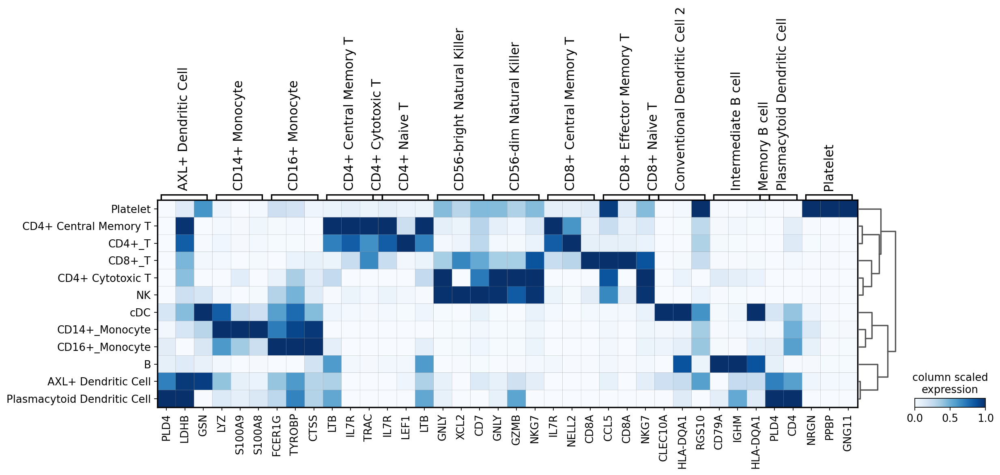

In [86]:
sc.pl.matrixplot(adata, marker_AZ ,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True,save="final.png",var_group_labels=[np.unique(adata.obs["Final_Annotation"])])

categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: AXL+ Dendritic Cell, CD14+ Monocyte, CD16+ Monocyte, etc.


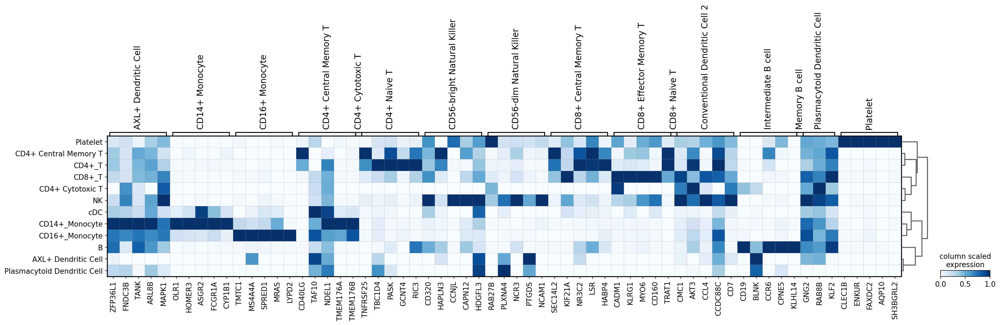

In [87]:
sc.pl.matrixplot(adata, markers ,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True,save="final.png")


categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD4+_T, CD8+_T, NK, etc.


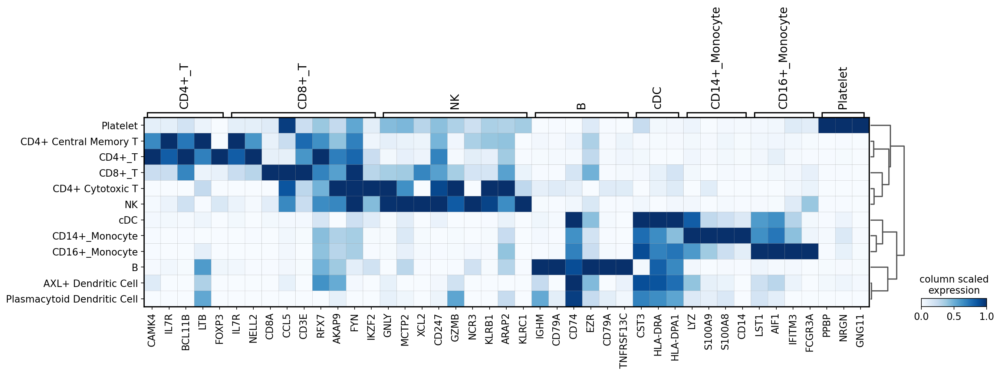

In [88]:
sc.pl.matrixplot(adata, marker_genes_dict_final,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True,save="final.png")


categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD4+ T, CD8+ T, NK, etc.


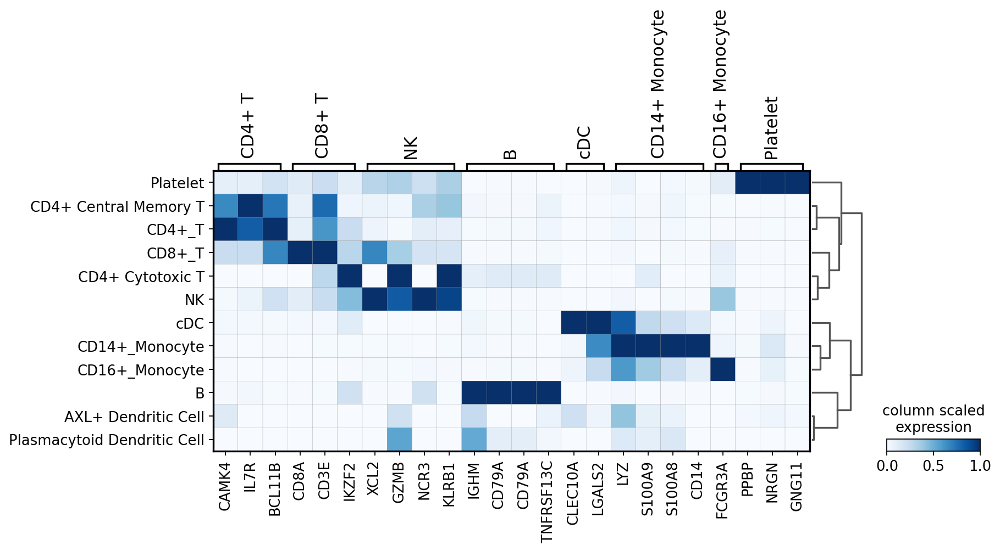

In [89]:
sc.pl.matrixplot(adata, marker_genes_dict_final_Twenty_Percent,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True,save="final.png")


categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD4+_T, CD8+_T, NK, etc.


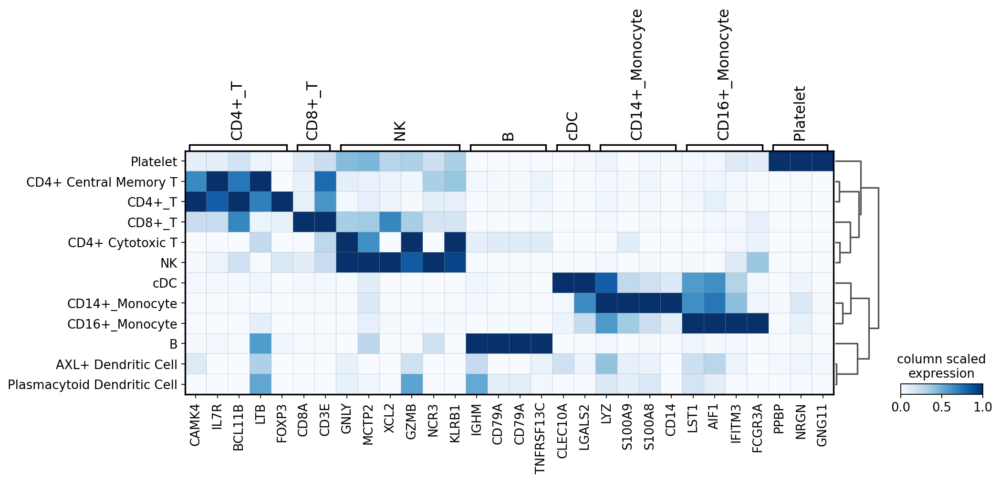

In [90]:
sc.pl.matrixplot(adata, marker_genes_dict_final_Thirty,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


categories: AXL+ Dendritic Cell, CD4+ Central Memory T, CD4+ Cytotoxic T, etc.
var_group_labels: CD4+_T, CD8+_T, NK, etc.


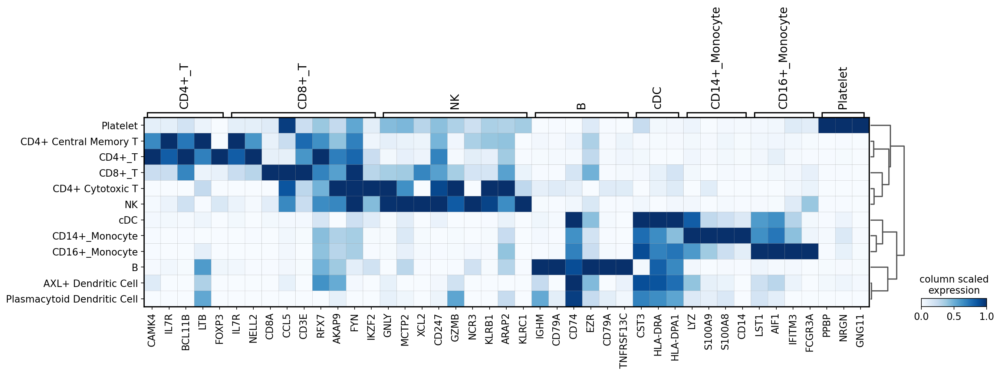

In [91]:
sc.pl.matrixplot(adata, marker_genes_dict_final,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


In [93]:
DEs = {}
for i in np.unique(adata.obs['Final_Annotation']):
    ranks=sc.get.rank_genes_groups_df(adata, group=i,key='wilcoxon')
    ranks = ranks[ranks["pct_nz_reference"]<0.1]
    #print(ranks.iloc[0:5, 0].values)
    DEs[i] = ranks.iloc[0:5, 0].tolist()
#DEs

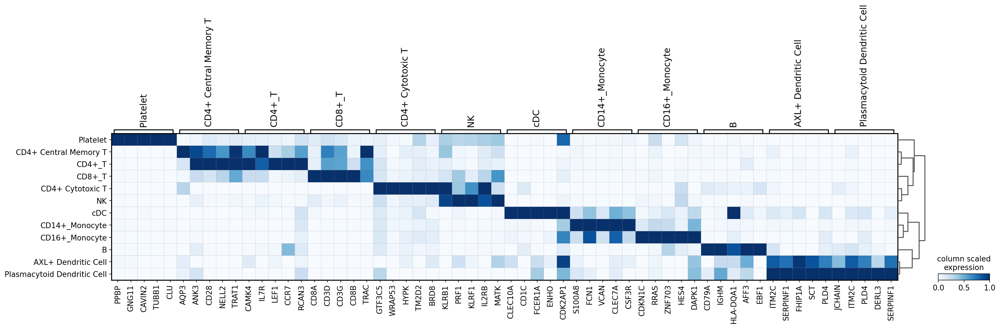

In [ ]:
sc.pl.matrixplot(adata, DEs,'Final_Annotation', dendrogram=True, 
                 cmap='Blues', standard_scale='var', colorbar_title='column scaled\nexpression', use_raw=True)


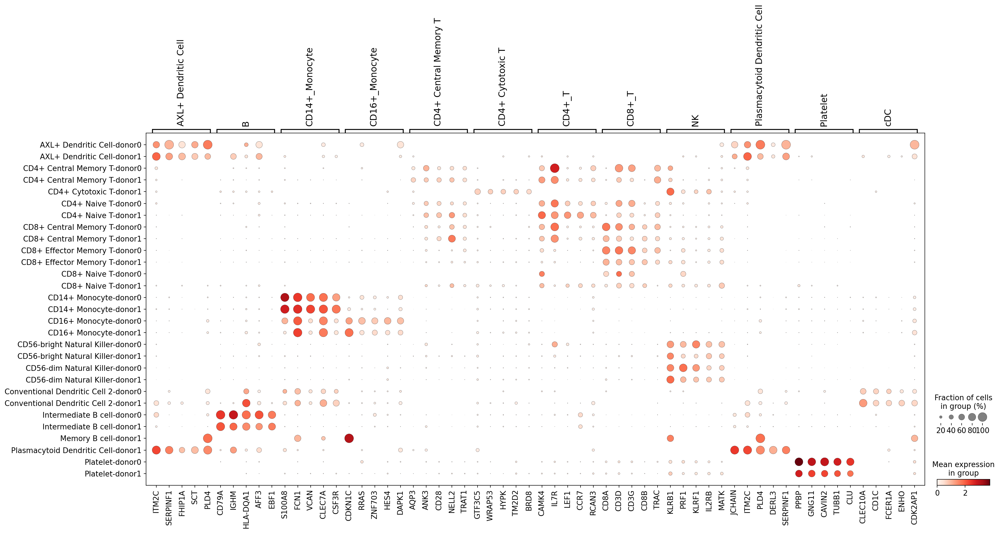

In [95]:
sc.pl.dotplot(adata,DEs, groupby='cell_type_donor',dendrogram=False, use_raw=True)

In [96]:
ranks =(sc.get.rank_genes_groups_df(adata,group=None,key="wilcoxon"))


In [97]:
sc.tl.rank_genes_groups(adata,'cell_type_donor', method='wilcoxon', key_added = "wilcoxon",pts=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)


In [ ]:
groups=np.unique(adata.obs.cell_type_donor)
groups=[x[:-1] for x in groups]
groups=np.unique(groups)

group_to_remove = 'CD4+ Cytotoxic T-donor'
group_to_remove2 = 'Plasmacytoid Dendritic Cell-donor'
groups = groups[groups != group_to_remove]
groups = groups[groups != group_to_remove2]
#fig, axes = plt.subplots(ncols=3, nrows=3, sharex=True, sharey=True)
#fig = plt.figure() # create the canvas for plotting
#ax1 = plt.subplot(2,1,1) 
# (2,1,1) indicates total number of rows, columns, and figure number respectively
#a=0
DE_genes=[]
for i in groups:
    sc.tl.rank_genes_groups(adata,'cell_type_donor', method='wilcoxon', key_added = "wilcoxon",pts=True,reference=(i+'1'))
    #sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon",groups=[i+"0"])
    t=sc.get.rank_genes_groups_df(adata,group=[i+"0"],key="wilcoxon")#plt.tight_layout()
    names = [i]*20639
    t.insert(2, "Cluster", names, True)
    #t.insert(4,"abs_logfoldchanges",abs(t.logfoldchanges),True)
    #print(t)
    #t=t[t["pvals_adj"]<0.05]
    #print(t)
    #t=t.sort_values("abs_logfoldchanges")
    #t=t[0:20]
    print(t)
    DE_genes.append(t)
    t=t[t["pvals_adj"]<0.05]
    t_up=t[t["logfoldchanges"]>1.5] 
    t_down=t[t["logfoldchanges"]<(-1.5)]
    t_DEG = t_up.append(t_down)
    #t_DEG.to_csv(("/home/mmokhtari/INF_analysis/DEGs/"+i+".csv"))
#plt.show()

In [100]:
# the file that will store the analysis results
#results_file_final = '/home/mmokhtari/INF_analysis/INF_analysis_final.h5ad' 

In [101]:
#adata.write(results_file_final)  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

In [102]:
##############################################################################################################

In [104]:
adata_original = sc.read_h5ad("/home/mmokhtari/INF_analysis/INF_analysis_final.h5ad")
adata_with_pDCs = sc.read_h5ad("/home/mmokhtari/INF_analysis/INF_analysis.h5ad")

In [105]:
adata_pDCs = adata_with_pDCs[adata_with_pDCs.obs["Ann_az_default"] == "Plasmacytoid Dendritic Cell"]
adata_pDCs.obs["Final_Annotation"]="pDC"

In [106]:
adata_original

AnnData object with n_obs × n_vars = 9260 × 2583
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'leiden', 'Ann_az_default', 'annotation_AZ', 'annotation_MACA', 'cell_type_donor', 'Final_Annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'annotation_AZ_colors', 'annotation_MACA_colors', 'cell_type_donor_colors', 'dendrogram_Final_Annotation', 'dendrogram_annotation_AZ', 'dendrogram_annotation_MACA', 'donor_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'wilcoxon'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [109]:
newlist = [adata_original, adata_pDCs]
adata = sc.AnnData.concatenate(*newlist)

In [110]:
adata.obs

,donor,n_genes_by_counts,total_counts,leiden,Ann_az_default,annotation_AZ,annotation_MACA,cell_type_donor,Final_Annotation,n_genes,total_counts_mt,pct_counts_mt,louvain_r1.2,batch
AAACCCAAGACTGGGT-1-0,donor1,1051,3960.0,10,B,Memory B cell,B cells,B-donor1,B,NaN,NaN,NaN,NaN,0
AAACCCAAGGATATGT-1-0,donor1,2930,7565.0,0,NK,CD56-bright Natural Killer,NK cells,NK-donor1,NK,NaN,NaN,NaN,NaN,0
AAACCCAAGGGATCGT-1-0,donor0,887,1383.0,13,CD8+_T,CD8+ Central Memory T,T cells,CD8+_T-donor0,CD8+_T,NaN,NaN,NaN,NaN,0
AAACCCACAATGTCAC-1-0,donor0,1512,3370.0,3,NK,CD56-dim Natural Killer,NK cells,NK-donor0,NK,NaN,NaN,NaN,NaN,0
AAACCCACAGATCCAT-1-0,donor0,1974,4135.0,3,NK,CD56-dim Natural Killer,NK cells,NK-donor0,NK,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTGTCTATCGTT-1-1,donor1,427,544.0,0,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,T cells,NaN,pDC,427.0,17.0,3.125000,0,1
TTTACGTGTGAGTAGC-1-1,donor1,2445,8387.0,16,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,unassigned,NaN,pDC,2446.0,190.0,2.265411,14,1
TTTACGTTCCAGCACG-1-1,genetic_doublet,492,756.0,0,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,Monocytes,NaN,pDC,492.0,28.0,3.703704,0,1
TTTATGCTCTTCCCGA-1-1,genetic_doublet,461,736.0,2,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,Monocytes,NaN,pDC,461.0,16.0,2.173913,2,1


In [111]:
adata.obs['cell_type_donor'] = adata.obs[['Final_Annotation','donor']].agg('-'.join, axis=1)

In [112]:
marker_genes_dict_final = {
    'CD4+_T':['CAMK4','IL7R','BCL11B', 'LTB','FOXP3'],
    'CD8+_T':['IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2'],
    'NK':['GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1'],
    'B':['IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C'],
    'cDC':['CST3','HLA-DRA','HLA-DPA1'],
    'CD14+_Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
    'pDC':["IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"]
}
#IL7R

In [115]:
#results_file_with_pDC = '/home/mmokhtari/INF_analysis/INF_analysis_with_pDC.h5ad' 

In [116]:
#adata.write(results_file_with_pDC)